In [51]:
import matplotlib.pyplot as plt
import numpy as np
import os
import timeit
import networkx as nx
from Bio.PDB import PDBParser
import pandas as pd
import faiss
import surface
from scipy.spatial import distance_matrix

import py3Dmol
import kora.install.rdkit
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Geometry import Point3D

In [52]:
pdb_directory = '/auto/datasets/masif/site/raw/01-benchmark_pdbs/'
pdb_files = [f for f in os.listdir(pdb_directory) if f.endswith('.pdb')]
molecule_names = [os.path.splitext(f)[0] for f in pdb_files]

In [53]:
RADIUS = {}
with open("atomtype.txt") as f:
    for line in f.readlines()[1:]:
        atom = line.split()[0]
        RADIUS[atom] = line.split()[-2]

print(RADIUS)
print(len(RADIUS))

{'Br': '3.95559e-01', 'BR': '3.95559e-01', 'C': '3.39967e-01', 'CA': '3.39967e-01', 'CB': '3.39967e-01', 'CC': '3.39967e-01', 'CK': '3.39967e-01', 'CM': '3.39967e-01', 'CN': '3.39967e-01', 'CQ': '3.39967e-01', 'CR': '3.39967e-01', 'CT': '3.39967e-01', 'CV': '3.39967e-01', 'CW': '3.39967e-01', 'C*': '3.39967e-01', 'C0': '3.05240e-01', 'F': '3.11815e-01', 'H': '1.06908e-01', 'HC': '2.64953e-01', 'H1': '2.47135e-01', 'H2': '2.29317e-01', 'H3': '2.11499e-01', 'HA': '2.59964e-01', 'H4': '2.51055e-01', 'H5': '2.42146e-01', 'HO': '0.00000e+00', 'HS': '1.06908e-01', 'HW': '0.00000e+00', 'HP': '1.95998e-01', 'I': '4.18722e-01', 'Cl': '4.40104e-01', 'Na': '3.32840e-01', 'IB': '8.90899e-01', 'MG': '1.41225e-01', 'N': '3.25000e-01', 'NA': '3.25000e-01', 'NB': '3.25000e-01', 'NC': '3.25000e-01', 'N2': '3.25000e-01', 'N3': '3.25000e-01', 'N*': '3.25000e-01', 'O': '2.95992e-01', 'OW': '3.15061e-01', 'OH': '3.06647e-01', 'OS': '3.00001e-01', 'O2': '2.95992e-01', 'P': '3.74177e-01', 'S': '3.56359e-01',

In [54]:
RADIUS_VDV = {}
for rad in RADIUS:
    RADIUS_VDV[rad] = float(RADIUS[rad]) / 2  

print(RADIUS_VDV)

{'Br': 0.1977795, 'BR': 0.1977795, 'C': 0.1699835, 'CA': 0.1699835, 'CB': 0.1699835, 'CC': 0.1699835, 'CK': 0.1699835, 'CM': 0.1699835, 'CN': 0.1699835, 'CQ': 0.1699835, 'CR': 0.1699835, 'CT': 0.1699835, 'CV': 0.1699835, 'CW': 0.1699835, 'C*': 0.1699835, 'C0': 0.15262, 'F': 0.1559075, 'H': 0.053454, 'HC': 0.1324765, 'H1': 0.1235675, 'H2': 0.1146585, 'H3': 0.1057495, 'HA': 0.129982, 'H4': 0.1255275, 'H5': 0.121073, 'HO': 0.0, 'HS': 0.053454, 'HW': 0.0, 'HP': 0.097999, 'I': 0.209361, 'Cl': 0.220052, 'Na': 0.16642, 'IB': 0.4454495, 'MG': 0.0706125, 'N': 0.1625, 'NA': 0.1625, 'NB': 0.1625, 'NC': 0.1625, 'N2': 0.1625, 'N3': 0.1625, 'N*': 0.1625, 'O': 0.147996, 'OW': 0.1575305, 'OH': 0.1533235, 'OS': 0.1500005, 'O2': 0.147996, 'P': 0.1870885, 'S': 0.1781795, 'SH': 0.1781795, 'CU': 0.1699835, 'K': 0.236801, 'Rb': 0.2633495, 'Cs': 0.30246, 'OW_spc': 0.1582785, 'HW_spc': 0.0, 'Li': 0.101295, 'Zn': 0.097999, 'HW_tip4pew': 0.0, 'OW_tip4pew': 0.1582175, 'HW_tip4p': 0.0, 'OW_tip4p': 0.1576825, 'HW_

In [55]:
name_x = pdb_files[0]  
pdb_path = os.path.join(pdb_directory, name_x)

parser = PDBParser(QUIET=True)
structure = parser.get_structure('mol', pdb_path)

# Проход по атомам в структуре и извлечение координат
atoms_names_and_coords_dict = {}
atom_names = []
print("Координаты атомов:")
for model in structure:
    for chain in model:
        for residue in chain:
            for atom in residue:
                name = atom.get_name()
                atom_names.append(name)
                coords = atom.get_coord().tolist()
                atoms_names_and_coords_dict[name] = coords

print(atoms_names_and_coords_dict)
print(atom_names)

Координаты атомов:
{'N': [4.3460001945495605, -31.468000411987305, 124.05699920654297], 'CA': [4.730999946594238, -32.61399841308594, 124.8550033569336], 'C': [4.336999893188477, -34.016998291015625, 124.41999816894531], 'O': [3.1040000915527344, -34.012001037597656, 124.20099639892578], 'CB': [4.23799991607666, -32.29499816894531, 126.26100158691406], 'CG': [5.085999965667725, -31.124000549316406, 126.83100128173828], 'SD': [12.649999618530273, -28.533000946044922, 125.48600006103516], 'CE': [11.218999862670898, -29.44099998474121, 125.0530014038086], 'H1': [-0.3529999852180481, -22.365999221801758, 141.5070037841797], 'H2': [-0.5120000243186951, -20.986000061035156, 141.93299865722656], 'H3': [0.23800000548362732, -21.291000366210938, 140.7270050048828], 'HA': [5.691999912261963, -32.70199966430664, 124.75800323486328], 'HB2': [3.2990000247955322, -32.051998138427734, 126.24099731445312], 'HB3': [4.316999912261963, -33.07600021362305, 126.83100128173828], 'HG2': [30.799999237060547, 

In [56]:
atoms_names_and_coords_list = list(atoms_names_and_coords_dict.items())
print(atoms_names_and_coords_list) 

[('N', [4.3460001945495605, -31.468000411987305, 124.05699920654297]), ('CA', [4.730999946594238, -32.61399841308594, 124.8550033569336]), ('C', [4.336999893188477, -34.016998291015625, 124.41999816894531]), ('O', [3.1040000915527344, -34.012001037597656, 124.20099639892578]), ('CB', [4.23799991607666, -32.29499816894531, 126.26100158691406]), ('CG', [5.085999965667725, -31.124000549316406, 126.83100128173828]), ('SD', [12.649999618530273, -28.533000946044922, 125.48600006103516]), ('CE', [11.218999862670898, -29.44099998474121, 125.0530014038086]), ('H1', [-0.3529999852180481, -22.365999221801758, 141.5070037841797]), ('H2', [-0.5120000243186951, -20.986000061035156, 141.93299865722656]), ('H3', [0.23800000548362732, -21.291000366210938, 140.7270050048828]), ('HA', [5.691999912261963, -32.70199966430664, 124.75800323486328]), ('HB2', [3.2990000247955322, -32.051998138427734, 126.24099731445312]), ('HB3', [4.316999912261963, -33.07600021362305, 126.83100128173828]), ('HG2', [30.7999992

In [57]:
# types = [item[0] for item in atoms_names_and_coords_list]  
# coords = np.array([item[1] for item in atoms_names_and_coords_list])
# rs = np.array(list(map(lambda x: RADIUS_VDV[x], types)), dtype = float)
# start_time = timeit.default_timer()
# points_coords, atoms_ids = surface.points_with_atomsid(coords, rs, additional_rad = 10)
# points_atom_types = [types[idx] for idx in atoms_ids]
# time = timeit.default_timer() - start_time
# print("Total time =", time)
# print("Atoms on surface =", len(points_coords))
# print(points_coords)
# print(atoms_ids)
# print(len(types))
# print(coords.shape)
# print(points_atom_types)

In [58]:
# # Определяем радиусы добавленных на поверхность точек
# points_radius = {}
# for point in points_atom_types:
#     if point in RADIUS_VDV:
#         points_radius[point] = RADIUS_VDV[point]

In [59]:
def get_atom_coords_and_types(pdb_path):
    parser = PDBParser(QUIET=True)
    structure = parser.get_structure('mol', pdb_path)
    coords = []
    atom_types = []
    
    # Чтение атомов и их координат
    for model in structure:
        for chain in model:
            for residue in chain:
                for atom in residue:
                    atom_types.append(atom.element)  
                    coords.append(atom.coord.tolist())
    return atom_types, np.array(coords)

In [60]:
def surface_points(pdb_path):
    structure = parser.get_structure('mol', pdb_path)

    # Проход по атомам в структуре и извлечение координат
    atoms_names_and_coords_dict = {}
    atom_names = []
    print("Координаты атомов:")
    for model in structure:
        for chain in model:
            for residue in chain:
                for atom in residue:
                    name = atom.get_name()
                    atom_names.append(name)
                    coords = atom.get_coord().tolist()
                    atoms_names_and_coords_dict[name] = coords

    atoms_names_and_coords_list = list(atoms_names_and_coords_dict.items())
    types = [item[0] for item in atoms_names_and_coords_list]  
    coords = np.array([item[1] for item in atoms_names_and_coords_list])
    rs = np.array(list(map(lambda x: RADIUS_VDV[x], types)), dtype = float)
    start_time = timeit.default_timer()
    points_coords, atoms_ids = surface.points_with_atomsid(coords, rs, additional_rad = 10)
    points_atom_types = [types[idx] for idx in atoms_ids]

    points_radius = {}
    for point in points_atom_types:
        if point in RADIUS_VDV:
            points_radius[point] = RADIUS_VDV[point]

    return points_atom_types, points_coords, points_radius

In [61]:
# Создание PDB файла из имеющихся данных
def create_pdb_data(atom_types, coords):
    pdb_data = ""
    for i, (atom_type, coord) in enumerate(zip(atom_types, coords), start=1):
        pdb_data += (
            f"HETATM{i:5d} {atom_type:<4} UNK     1    "
            f"{coord[0]:8.3f}{coord[1]:8.3f}{coord[2]:8.3f}  1.00  0.00           {atom_type[0]:<2}\n"
        )
    return pdb_data


In [62]:
def show_sphere_pdb(pdb_path):
    original_atom_types, original_coords = get_atom_coords_and_types(pdb_path)
    points_atom_types, points_coords, points_radius = surface_points(pdb_path)

    view = py3Dmol.view(width=800, height=600)
    
    # Визуализируем оригинальные атомы синим цветом
    for atom_type, coord in zip(original_atom_types, original_coords):
        radius = RADIUS_VDV.get(atom_type)
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061, 
            'color': 'blue', 
            'opacity': 0.8
        })
    
    # Визуализируем добавленные атомы (точки) красным цветом
    for atom_type, coord in zip(points_atom_types, points_coords):
        radius = points_radius.get(atom_type)
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061,  
            'color': 'red', 
            'opacity': 0.8
        })
    
    view.setStyle({'cartoon': {}})       
    view.zoomTo()                    
    view.show()                      

show_sphere_pdb(pdb_path)


Координаты атомов:
search_neighbours_time:  0.0061890846118330956 2.286986746870782 %
search_points_time:  0.2644327115267515 97.71301325312922 %


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [63]:
# Генерация уникальных цветов для каждого типа атома
def generate_color_map(atom_types):
    unique_atom_types = list(set(atom_types)) 
    num_types = len(unique_atom_types)
    colors = plt.cm.get_cmap('tab20', num_types)  
    color_map = {atom: colors(i) for i, atom in enumerate(unique_atom_types)}  
    return color_map

In [64]:
def show_colorful_sphere_pdb(pdb_path, style='stick'):

    original_atom_types, original_coords = get_atom_coords_and_types(pdb_path)
    points_atom_types, points_coords, points_radius = surface_points(pdb_path)

    color_map = generate_color_map(original_atom_types + points_atom_types)

    view = py3Dmol.view(width=800, height=600)
    
    for atom_type, coord in zip(original_atom_types, original_coords):
        radius = RADIUS_VDV.get(atom_type, 1.5) 
        color = rgb_to_hex(color_map[atom_type])  
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061, 
            'color': color, 
            'opacity': 0.8
        })
    
    for atom_type, coord in zip(points_atom_types, points_coords):
        radius = points_radius.get(atom_type, 1.5)  
        color = rgb_to_hex(color_map[atom_type])  
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061,  
            'color': color, 
            'opacity': 0.8
        })
    
    view.setStyle({'cartoon': {}})
    view.zoomTo()  
    view.show()  

def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % (int(rgb[0]*255), int(rgb[1]*255), int(rgb[2]*255))

show_colorful_sphere_pdb(pdb_path)


Координаты атомов:


search_neighbours_time:  0.006683094426989555 2.4343975373792763 %
search_points_time:  0.26784455869346857 97.56560246262073 %


/tmp/ipykernel_1744228/2813631432.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', num_types)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [65]:
def show_protein_spiral(pdb_path):
    with open(pdb_path, 'r') as pdb_file:
        pdb_data = pdb_file.read()

    view = py3Dmol.view(width=800, height=600)
    view.addModel(pdb_data, 'pdb')
    view.setStyle({'cartoon': {'color': 'green'}})

    points_atom_types, points_coords, points_radius = surface_points(pdb_path)
    original_atom_types, original_coords = get_atom_coords_and_types(pdb_path)

    color_map = generate_color_map(original_atom_types + points_atom_types)

    for atom_type, coord in zip(points_atom_types, points_coords):
        radius = points_radius.get(atom_type)
        color = rgb_to_hex(color_map[atom_type]) 
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061,
            'color': color,
            'opacity': 0.8
        })

    view.zoomTo()
    view.show()

show_protein_spiral(pdb_path)

Координаты атомов:
search_neighbours_time:  0.006407096982002258 2.3614834423579363 %
search_points_time:  0.26490951981395483 97.63851655764206 %


/tmp/ipykernel_1744228/2813631432.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', num_types)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [66]:
pdb_files

['1E0U_D.pdb',
 '1YUK_A.pdb',
 '3NHV_B.pdb',
 '1TUE_M.pdb',
 '2OOR_AB.pdb',
 '2AW6_F.pdb',
 '1GUS_C.pdb',
 '3QP8_D.pdb',
 '5B71_E.pdb',
 '1WOV_B.pdb',
 '1PZR_B.pdb',
 '1DXX_C.pdb',
 '3NN2_B.pdb',
 '1XR0_B.pdb',
 '1Z6Y_B.pdb',
 '4PAS_B.pdb',
 '2O8V_B.pdb',
 '2W9E_A.pdb',
 '1W39_A.pdb',
 '3SPS_A.pdb',
 '1JTG_B.pdb',
 '2PMS_C.pdb',
 '3P16_C.pdb',
 '1NQL_A.pdb',
 '2NZ8_B.pdb',
 '2YC2_D.pdb',
 '3C9G_B.pdb',
 '3P9W_A.pdb',
 '3A1Y_C.pdb',
 '3D4R_E.pdb',
 '2XNS_D.pdb',
 '2QH1_B.pdb',
 '1LBH_A.pdb',
 '4RWY_HL.pdb',
 '3SZK_C.pdb',
 '1YQV_Y.pdb',
 '3NIC_G.pdb',
 '1H18_A.pdb',
 '3P9I_C.pdb',
 '2DX5_B.pdb',
 '1NR9_C.pdb',
 '4WEU_B.pdb',
 '6AQ7_A.pdb',
 '4AFZ_C.pdb',
 '1UUG_A.pdb',
 '2BA0_B.pdb',
 '3TLF_F.pdb',
 '1SXJ_E.pdb',
 '3DTJ_A.pdb',
 '2HQW_A.pdb',
 '1J3L_A.pdb',
 '3ZRK_X.pdb',
 '3NDH_A.pdb',
 '3GOX_B.pdb',
 '2DVM_C.pdb',
 '1ORY_B.pdb',
 '3THO_A.pdb',
 '1U20_B.pdb',
 '3BQA_B.pdb',
 '4YOC_C.pdb',
 '1MCO_H.pdb',
 '3QKW_B.pdb',
 '3R4O_B.pdb',
 '2LEH_A.pdb',
 '4YL8_A.pdb',
 '3R74_B.pdb',
 '3STB_C

In [67]:
pdb_path_2 = os.path.join(pdb_directory, '3AMJ_C.pdb')


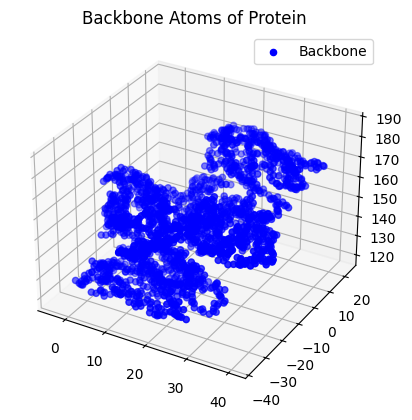

In [68]:
import MDAnalysis as mda
from MDAnalysis.analysis import align
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Загрузите PDB-файл
u = mda.Universe(pdb_path)

# Выберите атомы остова
backbone = u.select_atoms("name N CA C O")

# Получите координаты
coords = backbone.positions

# Визуализация
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], c="blue", label="Backbone")
ax.set_title("Backbone Atoms of Protein")
plt.legend()
plt.show()


In [69]:
def extract_backbone_atoms(input_pdb, output_pdb, sorted_output_pdb):
    backbone_atoms = {"N", "CA", "C", "O"}
    
    atoms_to_write = []
    
    # Чтение входного файла
    with open(input_pdb, "r") as infile:
        for line in infile:
            if line.startswith("ATOM") or line.startswith("HETATM"):
                atom_name = line[12:16].strip()  # Извлечение имени атома
                if atom_name in backbone_atoms:
                    atoms_to_write.append(line)
    
    # Запись данных в файл output_pdb
    with open(output_pdb, "w") as outfile:
        for atom in atoms_to_write:
            outfile.write(atom)
    
    # Сортировка атомов по атомному номеру (в данном случае по колонке с атомным номером, которая расположена с 6 по 11 символ)
    sorted_atoms = sorted(atoms_to_write, key=lambda x: int(x[6:11].strip()))  # Сортировка по атомному номеру
    
    # Запись отсортированных данных в файл sorted_output_pdb
    with open(sorted_output_pdb, "w") as sorted_file:
        for atom in sorted_atoms:
            sorted_file.write(atom)

# Пример использования:
input_pdb = pdb_path
output_pdb = "backbone.pdb"
sorted_output_pdb = "sorted_backbone.pdb"
extract_backbone_atoms(input_pdb, output_pdb, sorted_output_pdb)


In [70]:

    original_atom_types, original_coords = get_atom_coords_and_types(output_pdb)
    # points_atom_types, points_coords, points_radius = surface_points(pdb_path)

    # color_map = generate_color_map(original_atom_types + points_atom_types)

    view = py3Dmol.view(width=800, height=600)
    
    for atom_type, coord in zip(original_atom_types, original_coords):
        radius = RADIUS_VDV.get(atom_type, 1.5) 
        # color = rgb_to_hex(color_map[atom_type])  
        view.addSphere({
            'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
            'radius': radius + 3.15061, 
            'color': 'blue', 
            'opacity': 0.8
        })
    
    # for atom_type, coord in zip(points_atom_types, points_coords):
    #     radius = points_radius.get(atom_type, 1.5)  
    #     color = rgb_to_hex(color_map[atom_type])  
    #     view.addSphere({
    #         'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
    #         'radius': radius + 3.15061,  
    #         'color': color, 
    #         'opacity': 0.8
    #     })
    
    view.setStyle({'cartoon': {}})
    view.zoomTo()  
    view.show()  



3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [71]:
def extract_amino_acid_atoms(input_pdb, output_pdb):
    backbone_atoms = {"N", "CA", "C", "O"}
    
    atoms_to_write = []
    
    # Чтение входного файла
    with open(input_pdb, "r") as infile:
        for line in infile:
            if line.startswith("ATOM") or line.startswith("HETATM"):
                atom_name = line[12:16].strip()  # Извлечение имени атома
                if atom_name not in backbone_atoms:
                    atoms_to_write.append(line)
    
    # Запись данных в файл output_pdb
    with open(output_pdb, "w") as outfile:
        for atom in atoms_to_write:
            outfile.write(atom)

# Пример использования:
input_pdb = pdb_path
output_pdb_2 = "amino_acid.pdb"
extract_amino_acid_atoms(input_pdb, output_pdb_2)


In [72]:

original_atom_types, original_coords = get_atom_coords_and_types(output_pdb_2)

view = py3Dmol.view(width=800, height=600)
    
for atom_type, coord in zip(original_atom_types, original_coords):
    radius = RADIUS_VDV.get(atom_type, 1.5)  
    view.addSphere({
        'center': {'x': coord[0], 'y': coord[1], 'z': coord[2]},
        'radius': radius + 3.15061, 
        'color': 'blue', 
        'opacity': 0.8
    })

    
view.setStyle({'cartoon': {}})
view.zoomTo()  
view.show()  

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [73]:
with open(output_pdb_2, 'r') as output_pdb_2:
    pdb_data = output_pdb_2.read()

# Создание визуализации с помощью Py3Dmol
view = py3Dmol.view(width=800, height=600)
view.addModel(pdb_data, 'pdb')
view.setStyle({'cartoon': {'color': 'green'}})

# Увеличение масштаба и отображение молекулы
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.